# **Image Classification between AI Generated images and Actual/regular images**


### Image classification between AI-generated images and actual/regular images is important for quality control and security purposes. It helps in distinguishing between authentic images and those generated by AI algorithms, ensuring the reliability of visual content in various domains such as media, healthcare, and authentication systems. Additionally, it aids in detecting potential instances of misinformation, deepfake creation, and manipulation, safeguarding against deceptive practices and preserving trust in digital media.



<br>
<br>

## **Dataset downloading from Kaggle-**

In [ ]:
# THIS CELL IS IN ORDER TO IMPORT KAGGLE DATA SOURCES


import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'ai-generated-images-vs-real-images:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4423404%2F7598969%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240430%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240430T170943Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3Da0bfabbe9f6fd5872ebd5eed25a977695e55cb53d50876a8bc24ff4a0f1b5c9bf5a0db43cc3f2a8e205f85e65c839d6f49fddbc2571bc253de6c13332443dd489380ceb43b874f269fdb4602aa1c331813a0666ebbc2a2f6988c42995bdda69bc3d4fb7b170354381c27b6b4fd1761367d6f2bfdfd7f841d4fec61cc6372a91bb8cb1c47cb68ff79d0f79d6b5a292ce696ea4d200b8c59606327399cfe6380f1cad0bfa2dc15a63c8cbb9061e493717d3cfc3516e79eff2c37bcda1a8bc54e86b8e242963ea53a87c77cf277e93ba3e87677398d6d45f1a2290d6d223b882e37c614895953622313dcf45e12ea5c28b738984b5af1b9e4bc70f70f91a7248545'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')

[==================================================] 499048119 bytes downloaded
Downloaded and uncompressed: ai-generated-images-vs-real-images
Data source import complete.


<br>
<br>

# **Following are some random images from the dataset.**

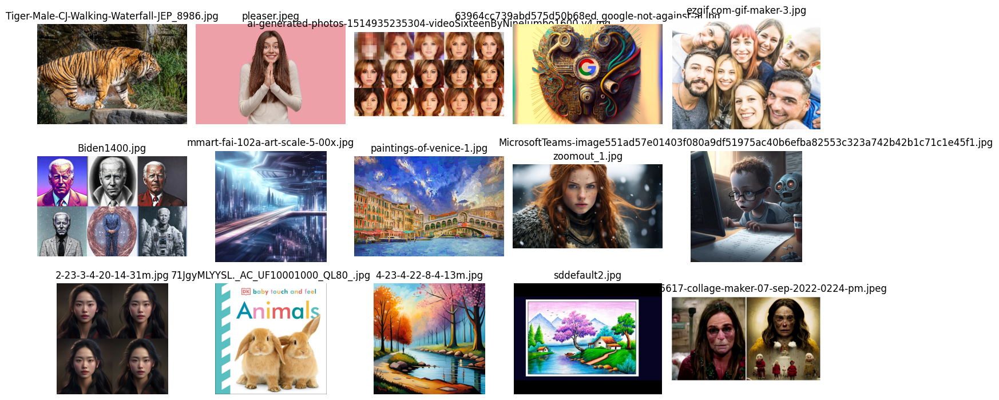

In [ ]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

# Set the root directory where images are stored
root_dir = "/kaggle/input/ai-generated-images-vs-real-images"

# Collect all image file paths
image_files = []
for subdir, dirs, files in os.walk(root_dir):
    for file in files:
        if file.lower().endswith(('.png', '.jpg', '.jpeg')):
            image_files.append(os.path.join(subdir, file))

# Randomly select 20 image paths
selected_images = random.sample(image_files, 15)

# Plot settings
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(14, 7))  # Adjust the figure size as needed
axes = axes.ravel()

# Load and display the images
for idx, img_path in enumerate(selected_images):
    image = Image.open(img_path)  # Open the image file
    axes[idx].imshow(image)  # Show the image
    axes[idx].set_title(os.path.basename(img_path))  # Optionally set the title as the filename
    axes[idx].axis('off')  # Turn off axis labels

plt.tight_layout()
plt.show()

<br>
<br>

# **1. Classification Using**
# **Logistic Regression and LDA-**

In [ ]:
pip install numpy pillow scikit-learn matplotlib

<br>
<br>

# **Loading and Splitting of Data**

In [ ]:
import os
import numpy as np
from PIL import Image
from sklearn.model_selection import train_test_split

def load_images(root_dir, size=(64, 64)):
    images = []
    labels = []
    categories = {'AiArtData': 0, 'RealArt': 1}

    for category, label in categories.items():
        category_path = os.path.join(root_dir, category, category)  # Adjusted path
        if os.path.exists(category_path) and os.path.isdir(category_path):
            print(f"Loading images from {category_path}")
            for filename in os.listdir(category_path):
                if filename.lower().endswith(('.jpg', '.png', '.jpeg')):  # Added JPEG for compatibility
                    image_path = os.path.join(category_path, filename)
                    try:
                        image = Image.open(image_path).convert('RGB')
                        image = image.resize(size)
                        images.append(np.array(image).flatten())
                        labels.append(label)
                    except Exception as e:
                        print(f"Failed to load image {image_path}: {e}")
        else:
            print(f"Category directory {category_path} not found or is not a directory.")

    print(f"Total images loaded: {len(images)}")
    return np.array(images), np.array(labels)

# Define the root directory based on your Kaggle environment
root_dir = "/kaggle/input/ai-generated-images-vs-real-images"
X, y = load_images(root_dir)

if len(X) > 0:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    print(f"Data split into {len(X_train)} training and {len(X_test)} test samples.")
else:
    print("No images loaded. Check the directory paths and image file accessibility.")


Loading images from /kaggle/input/ai-generated-images-vs-real-images/AiArtData/AiArtData


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Loading images from /kaggle/input/ai-generated-images-vs-real-images/RealArt/RealArt
Total images loaded: 970
Data split into 776 training and 194 test samples.


<br>
<br>

## **Logistic Regression and LDA Accuracy-**

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import accuracy_score

# Logistic Regression
log_reg = LogisticRegression(max_iter=1000)
log_reg.fit(X_train, y_train)
y_pred_log = log_reg.predict(X_test)
print("Logistic Regression Accuracy:", accuracy_score(y_test, y_pred_log))

# Linear Discriminant Analysis
lda = LinearDiscriminantAnalysis()
lda.fit(X_train, y_train)
y_pred_lda = lda.predict(X_test)
print("LDA Accuracy:", accuracy_score(y_test, y_pred_lda))

Logistic Regression Accuracy: 0.5721649484536082
LDA Accuracy: 0.4948453608247423


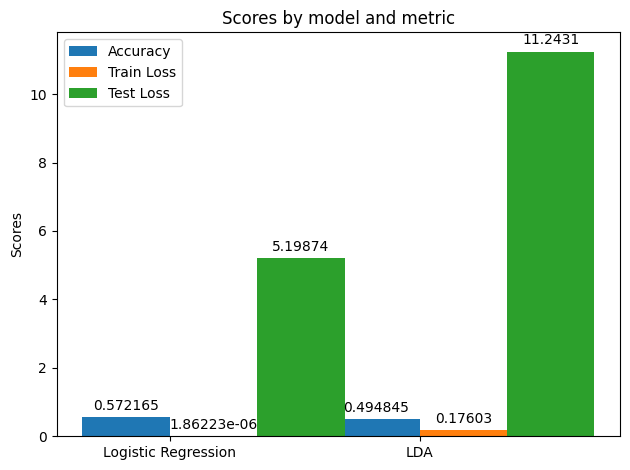

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import log_loss

# Assuming X_train, X_test, y_train, y_test are already defined and used as shown previously

# Logistic Regression
log_reg = LogisticRegression(max_iter=1000)
log_reg.fit(X_train, y_train)
y_pred_log = log_reg.predict(X_test)
log_accuracy = accuracy_score(y_test, y_pred_log)
log_train_prob = log_reg.predict_proba(X_train)
log_test_prob = log_reg.predict_proba(X_test)
log_train_loss = log_loss(y_train, log_train_prob)
log_test_loss = log_loss(y_test, log_test_prob)

# Linear Discriminant Analysis
lda = LinearDiscriminantAnalysis()
lda.fit(X_train, y_train)
y_pred_lda = lda.predict(X_test)
lda_accuracy = accuracy_score(y_test, y_pred_lda)
# Assuming similar probabilities can be computed for LDA, which is typically not the case
lda_train_prob = lda.predict_proba(X_train)
lda_test_prob = lda.predict_proba(X_test)
lda_train_loss = log_loss(y_train, lda_train_prob)
lda_test_loss = log_loss(y_test, lda_test_prob)

# Data for plotting
models = ['Logistic Regression', 'LDA']
accuracies = [log_accuracy, lda_accuracy]
train_losses = [log_train_loss, lda_train_loss]
test_losses = [log_test_loss, lda_test_loss]

x = np.arange(len(models))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, accuracies, width, label='Accuracy')
rects2 = ax.bar(x + width/2, train_losses, width, label='Train Loss')
rects3 = ax.bar(x + width*1.5, test_losses, width, label='Test Loss')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores')
ax.set_title('Scores by model and metric')
ax.set_xticks(x)
ax.set_xticklabels(models)
ax.legend()

ax.bar_label(rects1, padding=3)
ax.bar_label(rects2, padding=3)
ax.bar_label(rects3, padding=3)

fig.tight_layout()

plt.show()

<br>
<br>
<br>

# **Practical classification of an image- Where an image is uploaded to check whether it is AI generated or Actual/Regular**

<br>

In the following code cell-

**Flattening**: Flattening an image means converting it from a 2D or 3D array (height × width × channels) into a 1D array. This is often done to simplify the input data, especially when using traditional machine learning algorithms like LR and LDA, which typically require 1D input vectors.

**Reshaping**: After flattening, the image data is reshaped into a format that matches the input shape expected by the trained models. In this case, the images were resized to 64x64 pixels before being flattened. Reshaping ensures that the flattened array has the correct dimensions expected by the models.
By flattening and reshaping the images, we convert them into a format that can be fed into the LR and LDA models for prediction. Without this preprocessing step, the models would not be able to make predictions directly on the raw image data.

Saving AF.png to AF.png


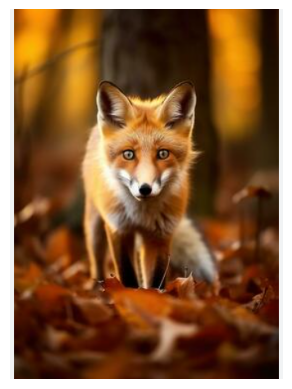

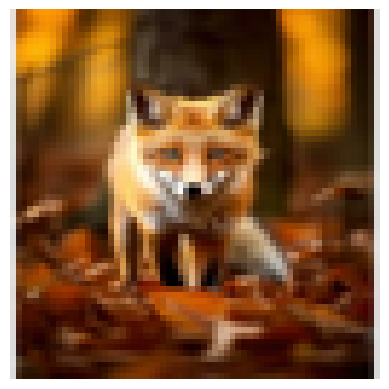



Logistic Regression Prediction: Real Art


LDA Prediction: Real Art


In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from google.colab import files


def upload_and_predict():
    uploaded = files.upload()  # Use files.upload() to upload image files
    for fn in uploaded.keys():
        path = '/content/' + fn
        image = Image.open(path).convert('RGB')
        image_resized = image.resize((64, 64))  # Assuming models were trained on 64x64 images
        plt.imshow(image)
        plt.axis('off')
        plt.show()
        plt.imshow(image_resized)
        plt.axis('off')
        plt.show()

        # Preprocess the image to match training data
        img_array = np.array(image_resized).flatten().reshape(1, -1)  # Flatten and reshape for the model

        # Predict using Logistic Regression and LDA
        pred_log_reg = log_reg.predict(img_array)
        pred_lda = lda.predict(img_array)

        # Convert predictions to human-readable labels
        labels = {0: 'AI-generated Art', 1: 'Real Art'}
        print("\n\nLogistic Regression Prediction:", labels[pred_log_reg[0]])
        print("\n\nLDA Prediction:", labels[pred_lda[0]])

upload_and_predict()

<br>

# Both the Logistic Regression and LDA classification are false for the above uploaded AI Generated Image.

<br>
<br><br>

Saving AM.png to AM.png


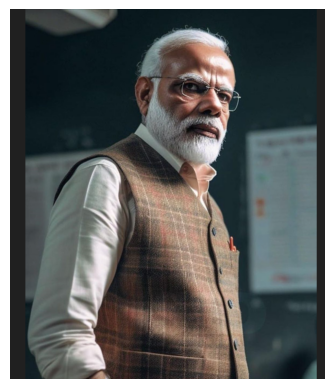

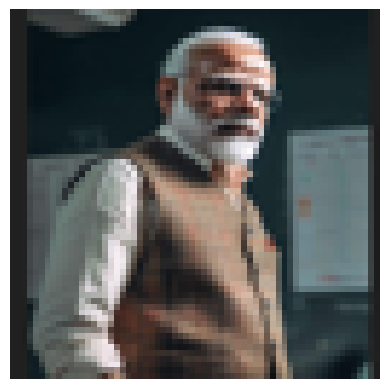



Logistic Regression Prediction: Real Art


LDA Prediction: AI-generated Art


In [ ]:
upload_and_predict()

# For the above uploaded AI Generated Image, the Logistic regression gives the False classification but LDA gives the correct.

<br>
<br><br>

Saving FR.png to FR.png


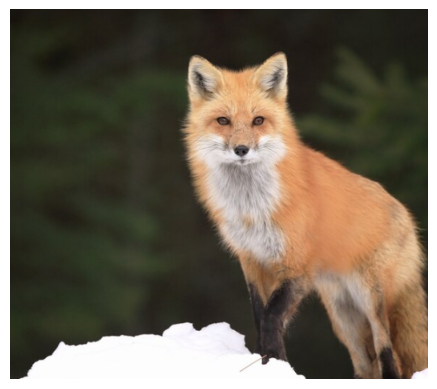

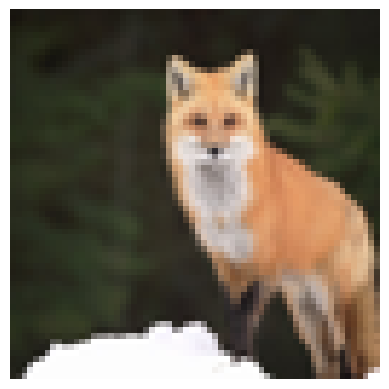



Logistic Regression Prediction: Real Art


LDA Prediction: AI-generated Art


In [ ]:
upload_and_predict()

# For the above uploaded AI Generated Image, the Logistic regression gives the Correct classification but LDA does not.

<br>
<br>
<br>
<br>

### Using Convolutional Neural Networks (CNNs) is generally more advantageous than using Logistic Regression or Linear Discriminant Analysis (LDA) for image classification tasks due to key reasons as:

### 1. **Feature Extraction**: CNNs automatically detect and learn the important features from images through their convolutional layers, without needing any manual feature engineering. This makes CNNs exceptionally powerful for handling complex image data.

### 2. **Hierarchical Learning**: CNNs learn hierarchies of features. Lower layers might detect edges and textures, while deeper layers can identify more complex structures like parts of objects or even whole objects. This layer-based feature learning is highly beneficial for processing images.

### In contrast, Logistic Regression and LDA generally require manual feature selection, do not preserve spatial information from images, and are linear models, which limits their ability to handle the complexity and high dimensionality of image data effectively. These limitations make CNNs a more suitable and powerful choice for image classification tasks.

<br>
<br>

# **MODEL** **2-**  **Simple CNN MODEL (Deep Learning)**

In [ ]:
pip install tensorflow scikit-learn matplotlib

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import MobileNetV2
import matplotlib.pyplot as plt

## Image Dataset Loading-

In [ ]:
root = "/kaggle/input/ai-generated-images-vs-real-images"
ai_images_path = os.path.join(root, "AiArtData")
real_images_path = os.path.join(root, "RealArt")

# Creating a generator to read images found in subfolders
datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)  # normalize and split data

train_generator = datagen.flow_from_directory(    #flow_from_directory recognises the subfolders to load the data
    root,
    target_size=(128, 128),
    batch_size=32,
    class_mode='binary',
    subset='training'
)

validation_generator = datagen.flow_from_directory(
    root,
    target_size=(128, 128),
    batch_size=32,
    class_mode='binary',
    subset='validation'
)


Found 777 images belonging to 2 classes.
Found 193 images belonging to 2 classes.


Found 777 images belonging to 2 classes: This line indicates that the train_generator has successfully found a total of 777 images distributed across two different classes in the specified root directory. The two classes are likely 'AiArtData' and 'RealArt', which correspond to AI-generated and actual images, respectively. This dataset will be used to train the model.

Found 193 images belonging to 2 classes: Similarly, this line tells that the validation_generator has found 193 images, also spread across the same two classes. These images will be used to validate the performance of your model, i.e., to test how well your model works with unseen data. This helps to ensure that the model is not just memorizing the training data but is learning features that generalize well to new data.


# .

## **Simple CNN Model training-**

In [ ]:
model1 = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(512, activation='relu'),
    Dense(1, activation='sigmoid')
])

model1.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
history1 = model1.fit(train_generator, validation_data=validation_generator, epochs=10)

Epoch 1/10
22/25 [=========================>....] - ETA: 2s - loss: 0.7710 - accuracy: 0.5242

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


25/25 [==============================] - 29s 915ms/step - loss: 0.7565 - accuracy: 0.5495 - val_loss: 0.6638 - val_accuracy: 0.5699
Epoch 2/10
25/25 [==============================] - 22s 881ms/step - loss: 0.6709 - accuracy: 0.6049 - val_loss: 0.6481 - val_accuracy: 0.6580
Epoch 3/10
25/25 [==============================] - 22s 865ms/step - loss: 0.6465 - accuracy: 0.6345 - val_loss: 0.6375 - val_accuracy: 0.6477
Epoch 4/10
25/25 [==============================] - 22s 862ms/step - loss: 0.6302 - accuracy: 0.6268 - val_loss: 0.6516 - val_accuracy: 0.6321
Epoch 5/10
25/25 [==============================] - 24s 979ms/step - loss: 0.5891 - accuracy: 0.7027 - val_loss: 0.6526 - val_accuracy: 0.6321
Epoch 6/10
25/25 [==============================] - 22s 897ms/step - loss: 0.5168 - accuracy: 0.7452 - val_loss: 0.7291 - val_accuracy: 0.5648
Epoch 7/10
25/25 [==============================] - 22s 906ms/step - loss: 0.4351 - accuracy: 0.8198 - val_loss: 0.7395 - val_accuracy: 0.6218
Epoch 8/10

In [ ]:
import io
from google.colab import files
from tensorflow.keras.preprocessing import image
from PIL import Image
import numpy as np

def classify_image(file_content, model):
    # Load and preprocess the image from file-like object
    img = image.load_img(io.BytesIO(file_content), target_size=(128, 128))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.  # Rescale to match training data normalization

    # Predict the class of the image
    prediction = model.predict(img_array)

    # Interpret the prediction
    if prediction[0][0] >= 0.5:
        return "AI-generated"
    else:
        return "Actual image"

Saving AF.png to AF (1).png


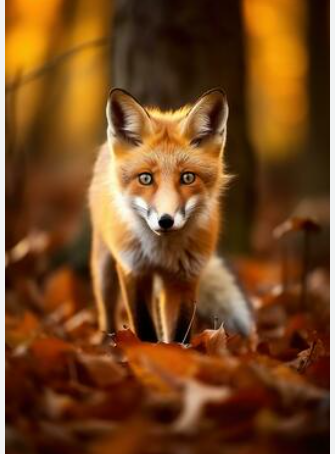

1/1 [==============================] - 0s 104ms/step


The uploaded image is: Actual image


In [ ]:
# Upload the file
uploaded = files.upload()

filename = next(iter(uploaded))  # Get the first key in the dictionary of uploaded files

# Load the image for display
loaded_img = Image.open(io.BytesIO(uploaded[filename]))

# Display the image
display(loaded_img)

# Get the file content from the uploaded dictionary
if uploaded:
    for filename, content in uploaded.items():
        result = classify_image(content, model1)
        print("\n\nThe uploaded image is:", result)
else:
    print("No file was uploaded.")

## **The Image is Falsely Classified as Actual image with simple CNN, when it is AI Generated.**

<br>
<br><br>

Saving AM.png to AM (1).png


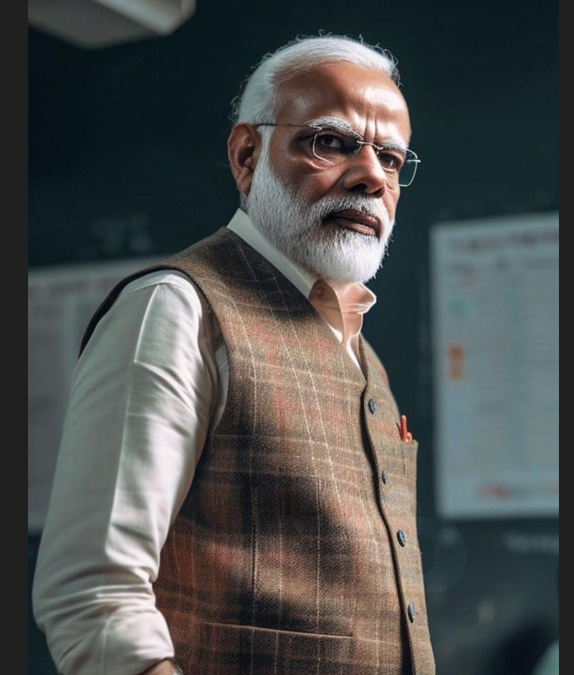

1/1 [==============================] - 0s 27ms/step


The uploaded image is: AI-generated


In [ ]:
# Upload the file
uploaded = files.upload()

filename = next(iter(uploaded))  # Get the first key in the dictionary of uploaded files

# Load the image for display
loaded_img = Image.open(io.BytesIO(uploaded[filename]))

# Display the image
display(loaded_img)

# Get the file content from the uploaded dictionary
if uploaded:
    for filename, content in uploaded.items():
        result = classify_image(content, model1)
        print("\n\nThe uploaded image is:", result)
else:
    print("No file was uploaded.")

## **For the above image, the classification as AI Generated, is correct by Simple CNN.**

<br>
<br><br>

Saving FR.png to FR (1).png


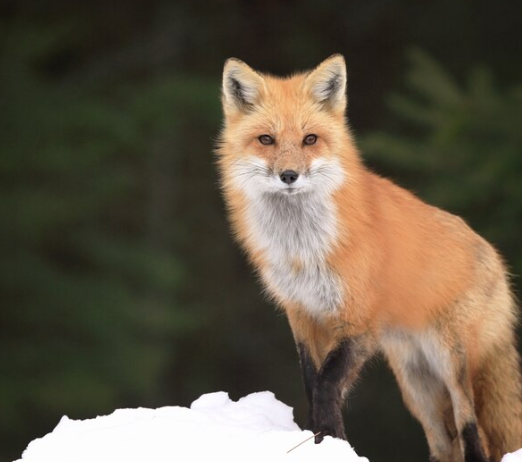

1/1 [==============================] - 0s 20ms/step


The uploaded image is: AI-generated


In [ ]:
# Upload the file
uploaded = files.upload()

filename = next(iter(uploaded))  # Get the first key in the dictionary of uploaded files

# Load the image for display
loaded_img = Image.open(io.BytesIO(uploaded[filename]))

# Display the image
display(loaded_img)

# Get the file content from the uploaded dictionary
if uploaded:
    for filename, content in uploaded.items():
        result = classify_image(content, model1)
        print("\n\nThe uploaded image is:", result)
else:
    print("No file was uploaded.")

## **For the above Real image, the classification made by Simple CNN as AI Generated, is wrong.**

<br>
<br><br>

# **Model 3: Pretrained MobileNetV2 (Deep Learning) -**

In [ ]:
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(128, 128, 3))
base_model.trainable = False  # Freeze layers

model2 = Sequential([
    base_model,
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

model2.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
history2 = model2.fit(train_generator, validation_data=validation_generator, epochs=10)

9406464/9406464 [==============================] - 0s 0us/step
Epoch 1/10
25/25 [==============================] - 28s 913ms/step - loss: 3.3220 - accuracy: 0.6255 - val_loss: 0.7634 - val_accuracy: 0.8083
Epoch 2/10
25/25 [==============================] - 23s 916ms/step - loss: 0.5039 - accuracy: 0.8121 - val_loss: 0.4850 - val_accuracy: 0.7979
Epoch 3/10
25/25 [==============================] - 22s 895ms/step - loss: 0.2212 - accuracy: 0.9266 - val_loss: 0.5177 - val_accuracy: 0.7772
Epoch 4/10
25/25 [==============================] - 23s 903ms/step - loss: 0.1373 - accuracy: 0.9498 - val_loss: 0.4590 - val_accuracy: 0.8031
Epoch 5/10
25/25 [==============================] - 22s 895ms/step - loss: 0.0896 - accuracy: 0.9665 - val_loss: 0.4694 - val_accuracy: 0.8083
Epoch 6/10
25/25 [==============================] - 22s 888ms/step - loss: 0.0529 - accuracy: 0.9871 - val_loss: 0.5374 - val_accuracy: 0.8446
Epoch 7/10
25/25 [==============================] - 21s 862ms/step - loss: 0.04

In [ ]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

def classify_image(file_content, model, filename):
    # Read and prepare image
    img = image.load_img(io.BytesIO(file_content), target_size=(128, 128))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)  # Preprocess the image data for the model

    # Make prediction
    prediction = model.predict(img_array)

    # Interpret the prediction
    if prediction[0][0] >= 0.5:
        print(f"\n\nThe image {filename} is: AI-generated")
    else:
        print(f"\n\nThe image {filename} is: Actual image")

Saving Screenshot 2024-04-29 005520.png to Screenshot 2024-04-29 005520.png


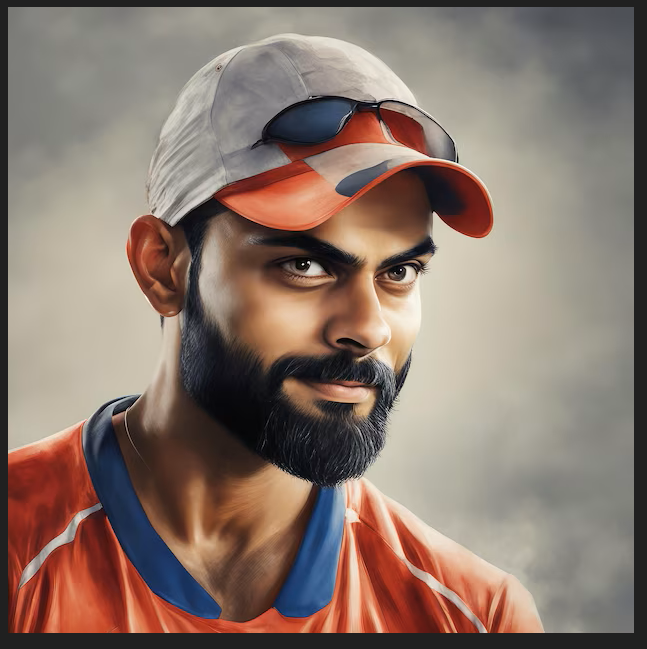

1/1 [==============================] - 1s 802ms/step


The image Screenshot 2024-04-29 005520.png is: AI-generated


In [ ]:
# Upload the file
uploaded = files.upload()

filename = next(iter(uploaded))  # Get the first key in the dictionary of uploaded files

# Load the image for display
loaded_img = Image.open(io.BytesIO(uploaded[filename]))

# Display the image
display(loaded_img)

if uploaded:
  for filename, file_content in uploaded.items():
    classify_image(file_content, model2, filename)

## **For the above AI image, the classification made by Mobile NetV2 as AI Generated, is correct.**

Saving RM.png to RM.png


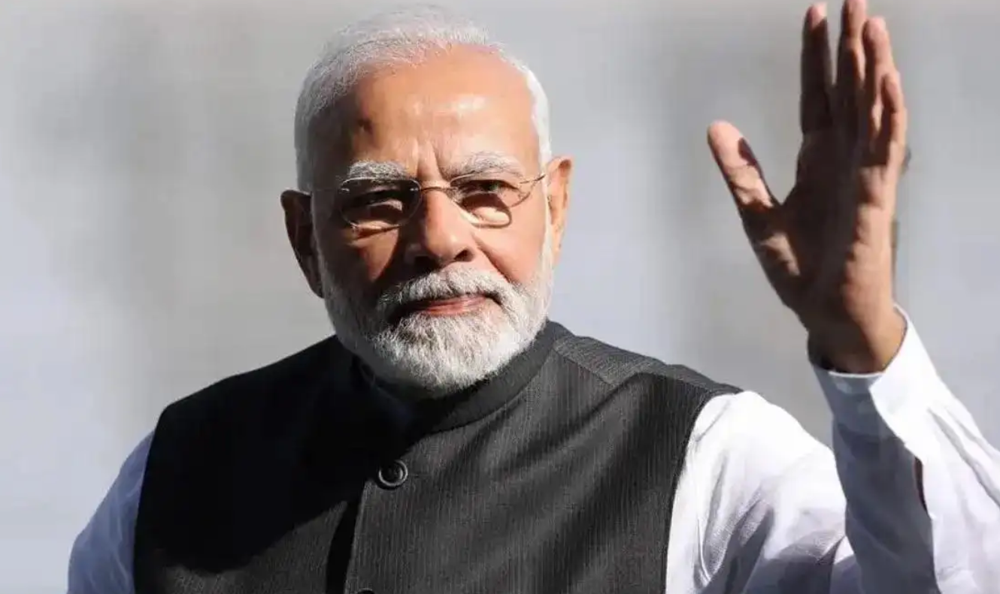

1/1 [==============================] - 0s 46ms/step


The image RM.png is: Actual image


In [ ]:
# Upload the file
uploaded = files.upload()

filename = next(iter(uploaded))  # Get the first key in the dictionary of uploaded files

# Load the image for display
loaded_img = Image.open(io.BytesIO(uploaded[filename]))

# Display the image
display(loaded_img)

if uploaded:
  for filename, file_content in uploaded.items():
    classify_image(file_content, model2, filename)

## **For the above Real image, the classification made by Mobile NetV2 as Actual Image, is correct.**

<br>
<br><br>

# **Accuracy and loss metrics comparison with graphs**

## **1. For Simple CNN**

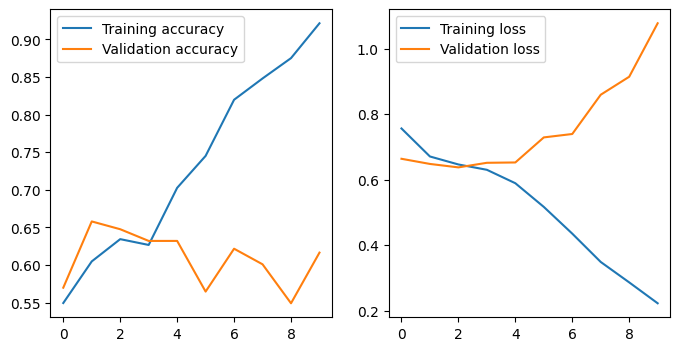

In [ ]:
import matplotlib.pyplot as plt

def plot_history(history):
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation accuracy')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training loss')
    plt.plot(history.history['val_loss'], label='Validation loss')
    plt.legend()
    plt.show()

# 'history1' and 'history2' are from different models or training runs.
plot_history(history1)

<br>
<br>

## **2. For Mobile NetV2-**

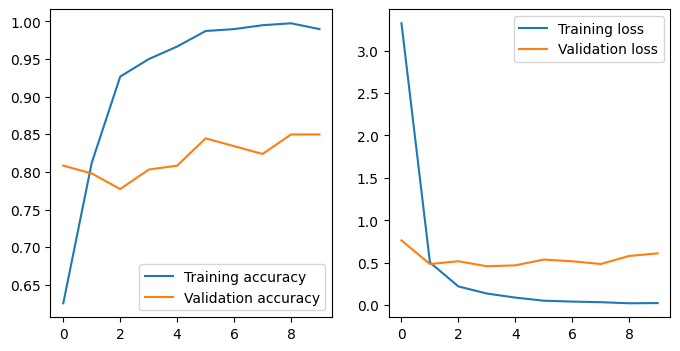

In [ ]:
plot_history(history2)

<br>
<br>
<br>

# **Model 3- RexNet_150 (Deep Learning)**

In [ ]:
!pip install timm
!pip install torchmetrics

<br>
<br>

# **Training the Model-**

In [ ]:
import os, timm, torchmetrics, torch, shutil, numpy as np
from glob import glob; from PIL import Image
from tqdm import tqdm

# Set a fixed seed for reproducibility
torch.manual_seed(2024)

# Define a custom dataset class inheriting from PyTorch's Dataset
class CustomDataset(Dataset):
    def __init__(self, root, transformations=None):
        self.transformations = transformations  # Store image transformations
        self.im_paths = [im_path for im_path in sorted(glob(f"{root}/*/*/*"))]  # List all image paths

        # Initialize dictionaries to store class names and counts
        self.cls_names, self.cls_counts = {}, {}
        count = 0
        # Loop through all image paths to populate class names and counts
        for idx, im_path in enumerate(self.im_paths):
            class_name = self.get_class(im_path)
            # If class name is new, initialize its entry in dictionaries
            if class_name not in self.cls_names:
                self.cls_names[class_name] = count
                self.cls_counts[class_name] = 1
                count += 1
            else:
                self.cls_counts[class_name] += 1

    # Helper method to extract class name from file path
    def get_class(self, path):
        return os.path.dirname(path).split("/")[-1]

    # Return the total number of images
    def __len__(self):
        return len(self.im_paths)

    # Method to get a single item from the dataset
    def __getitem__(self, idx):
        im_path = self.im_paths[idx]
        im = Image.open(im_path).convert("RGB")  # Open image and convert to RGB
        gt = self.cls_names[self.get_class(im_path)]  # Get ground truth label

        # Apply transformations if any
        if self.transformations is not None:
            im = self.transformations(im)

        return im, gt

# Function to prepare data loaders for training, validation, and test
def get_dls(root, transformations, bs, split=[0.9, 0.05, 0.05], ns=4):
    ds = CustomDataset(root=root, transformations=transformations)
    total_len = len(ds)
    tr_len = int(total_len * split[0])  # Number of training samples
    vl_len = int(total_len * split[1])  # Number of validation samples
    ts_len = total_len - (tr_len + vl_len)  # Number of test samples

    # Split dataset into training, validation, and test sets
    tr_ds, vl_ds, ts_ds = random_split(dataset=ds, lengths=[tr_len, vl_len, ts_len])

    # Create data loaders for each set
    tr_dl = DataLoader(tr_ds, batch_size=bs, shuffle=True, num_workers=ns)
    val_dl = DataLoader(vl_ds, batch_size=bs, shuffle=False, num_workers=ns)
    ts_dl = DataLoader(ts_ds, batch_size=1, shuffle=False, num_workers=ns)

    return tr_dl, val_dl, ts_dl, ds.cls_names

# Example usage of the above function with transformations
root = "/kaggle/input/ai-generated-images-vs-real-images"
mean, std, im_size = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225], 224
tfs = T.Compose([
    T.Resize((im_size, im_size)),
    T.ToTensor(),
    T.Normalize(mean=mean, std=std)
])
tr_dl, val_dl, ts_dl, classes = get_dls(root=root, transformations=tfs, bs=32)

# Print sizes of the datasets
print(len(tr_dl), len(val_dl), len(ts_dl), classes)

# Setup model, loss, and optimizer for training
def train_setup(m):
    return m.to("cuda").eval(), 10, "cuda", torch.nn.CrossEntropyLoss(), torch.optim.Adam(params=m.parameters(), lr=3e-4)

def to_device(batch, device):
    return batch[0].to(device), batch[1].to(device)

def get_metrics(model, ims, gts, loss_fn, epoch_loss, epoch_acc, epoch_f1):
    preds = model(ims)
    loss = loss_fn(preds, gts)
    return loss, epoch_loss + (loss.item()), epoch_acc + (torch.argmax(preds, dim=1) == gts).sum().item(), epoch_f1 + f1_score(preds, gts)

# Initialize the model and other components
m = timm.create_model("rexnet_150", pretrained=True, num_classes=len(classes))
m, epochs, device, loss_fn, optimizer = train_setup(m)

# Prepare metrics computation
f1_score = torchmetrics.F1Score(task="multiclass", num_classes=len(classes)).to(device)
save_prefix, save_dir = "AI", "saved_models"

print("Start training...")
best_acc, best_loss, threshold, not_improved, patience = 0, float("inf"), 0.01, 0, 5
tr_losses, val_losses, tr_accs, val_accs, tr_f1s, val_f1s = [], [], [], [], [], []

best_loss = float(torch.inf)

for epoch in range(epochs):
    epoch_loss, epoch_acc, epoch_f1 = 0, 0, 0
    for idx, batch in tqdm(enumerate(tr_dl)):
        ims, gts = to_device(batch, device)
        loss, epoch_loss, epoch_acc, epoch_f1 = get_metrics(m, ims, gts, loss_fn, epoch_loss, epoch_acc, epoch_f1)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    tr_loss_to_track = epoch_loss / len(tr_dl)
    tr_acc_to_track  = epoch_acc / len(tr_dl.dataset)
    tr_f1_to_track   = epoch_f1 / len(tr_dl)
    tr_losses.append(tr_loss_to_track)
    tr_accs.append(tr_acc_to_track)
    tr_f1s.append(tr_f1_to_track)

    print(f"{epoch + 1}-epoch train process is completed!")
    print(f"{epoch + 1}-epoch train loss          -> {tr_loss_to_track:.3f}")
    print(f"{epoch + 1}-epoch train accuracy      -> {tr_acc_to_track:.3f}")
    print(f"{epoch + 1}-epoch train f1-score      -> {tr_f1_to_track:.3f}")

    m.eval()
    with torch.no_grad():
        val_epoch_loss, val_epoch_acc, val_epoch_f1 = 0, 0, 0
        for idx, batch in enumerate(val_dl):
            ims, gts = to_device(batch, device)
            loss, val_epoch_loss, val_epoch_acc, val_epoch_f1 = get_metrics(m, ims, gts, loss_fn, val_epoch_loss, val_epoch_acc, val_epoch_f1)

        val_loss_to_track = val_epoch_loss / len(val_dl)
        val_acc_to_track  = val_epoch_acc / len(val_dl.dataset)
        val_f1_to_track   = val_epoch_f1 / len(val_dl)
        val_losses.append(val_loss_to_track)
        val_accs.append(val_acc_to_track)
        val_f1s.append(val_f1_to_track)

        print(f"{epoch + 1}-epoch validation process is completed!")
        print(f"{epoch + 1}-epoch validation loss     -> {val_loss_to_track:.3f}")
        print(f"{epoch + 1}-epoch validation accuracy -> {val_acc_to_track:.3f}")
        print(f"{epoch + 1}-epoch validation f1-score -> {val_f1_to_track:.3f}")

        if val_loss_to_track < (best_loss + threshold):
            os.makedirs(save_dir, exist_ok=True)
            best_loss = val_loss_to_track
            torch.save(m.state_dict(), f"{save_dir}/{save_prefix}_best_model.pth")
        else:
            not_improved += 1
            print(f"Loss value did not decrease for {not_improved} epochs")
            if not_improved == patience:
                print(f"Stop training since loss value did not decrease for {patience} epochs.")
                break

28 2 50 {'AiArtData': 0, 'RealArt': 1}
Start training...


8it [00:11,  1.13it/s]/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
28it [00:27,  1.03it/s]

1-epoch train process is completed!
1-epoch train loss          -> 1.172
1-epoch train accuracy      -> 0.657
1-epoch train f1-score      -> 0.659


1-epoch validation process is completed!
1-epoch validation loss     -> 0.822
1-epoch validation accuracy -> 0.688
1-epoch validation f1-score -> 0.703


8it [00:11,  1.13it/s]/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
28it [00:27,  1.01it/s]

2-epoch train process is completed!
2-epoch train loss          -> 0.447
2-epoch train accuracy      -> 0.790
2-epoch train f1-score      -> 0.788


2-epoch validation process is completed!
2-epoch validation loss     -> 0.480
2-epoch validation accuracy -> 0.792
2-epoch validation f1-score -> 0.750


17it [00:19,  1.37it/s]/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
21it [00:23,  1.42it/s]/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
28it [00:27,  1.02it/s]

3-epoch train process is completed!
3-epoch train loss          -> 0.288
3-epoch train accuracy      -> 0.882
3-epoch train f1-score      -> 0.881


3-epoch validation process is completed!
3-epoch validation loss     -> 1.074
3-epoch validation accuracy -> 0.562
3-epoch validation f1-score -> 0.547
Loss value did not decrease for 1 epochs


0it [00:00, ?it/s]/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
20it [00:21,  1.68it/s]/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
28it [00:26,  1.04it/s]

4-epoch train process is completed!
4-epoch train loss          -> 0.253
4-epoch train accuracy      -> 0.882
4-epoch train f1-score      -> 0.885


4-epoch validation process is completed!
4-epoch validation loss     -> 0.498
4-epoch validation accuracy -> 0.792
4-epoch validation f1-score -> 0.797
Loss value did not decrease for 2 epochs


0it [00:00, ?it/s]/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
6it [00:08,  1.32s/it]/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
28it [00:26,  1.04it/s]

5-epoch train process is completed!
5-epoch train loss          -> 0.107
5-epoch train accuracy      -> 0.961
5-epoch train f1-score      -> 0.962


5-epoch validation process is completed!
5-epoch validation loss     -> 0.494
5-epoch validation accuracy -> 0.771
5-epoch validation f1-score -> 0.750
Loss value did not decrease for 3 epochs


5it [00:08,  1.04s/it]/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
28it [00:27,  1.04it/s]

6-epoch train process is completed!
6-epoch train loss          -> 0.044
6-epoch train accuracy      -> 0.985
6-epoch train f1-score      -> 0.985


6-epoch validation process is completed!
6-epoch validation loss     -> 0.773
6-epoch validation accuracy -> 0.729
6-epoch validation f1-score -> 0.750
Loss value did not decrease for 4 epochs


0it [00:00, ?it/s]/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
8it [00:12,  1.16it/s]/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
28it [00:29,  1.04s/it]

7-epoch train process is completed!
7-epoch train loss          -> 0.026
7-epoch train accuracy      -> 0.991
7-epoch train f1-score      -> 0.991


7-epoch validation process is completed!
7-epoch validation loss     -> 0.538
7-epoch validation accuracy -> 0.833
7-epoch validation f1-score -> 0.828
Loss value did not decrease for 5 epochs
Stop training since loss value did not decrease for 5 epochs.


In [ ]:
def classify_uploaded_image(model, device, classes):
    for filename in uploaded.keys():
        im = Image.open(io.BytesIO(uploaded[filename])).convert("RGB")
        im = tfs(im).unsqueeze(0).to(device)
        with torch.no_grad():
            output = model(im)
        _, predicted = torch.max(output, 1)
        predicted_class = list(classes.keys())[predicted.item()]  # Get the class name using the predicted index
        print(f"\n\n{filename} is classified as {predicted_class}")

Saving Screenshot 2024-05-01 031013.png to Screenshot 2024-05-01 031013 (1).png


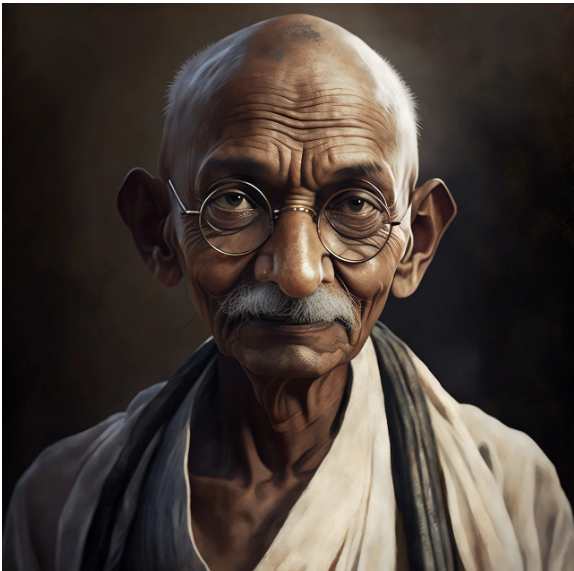



Screenshot 2024-05-01 031013 (1).png is classified as AiArtData


In [ ]:
from google.colab import files

uploaded = files.upload()

filename = next(iter(uploaded))  # Get the first key in the dictionary of uploaded files

# Load the image for display
loaded_img = Image.open(io.BytesIO(uploaded[filename]))

# Display the image
display(loaded_img)

if uploaded:
  classify_uploaded_image(m, device, classes)

# **Above Image is Correctly Classified as AI Art.**

<br>
<br><br>

Saving Gandhi.jpg to Gandhi.jpg


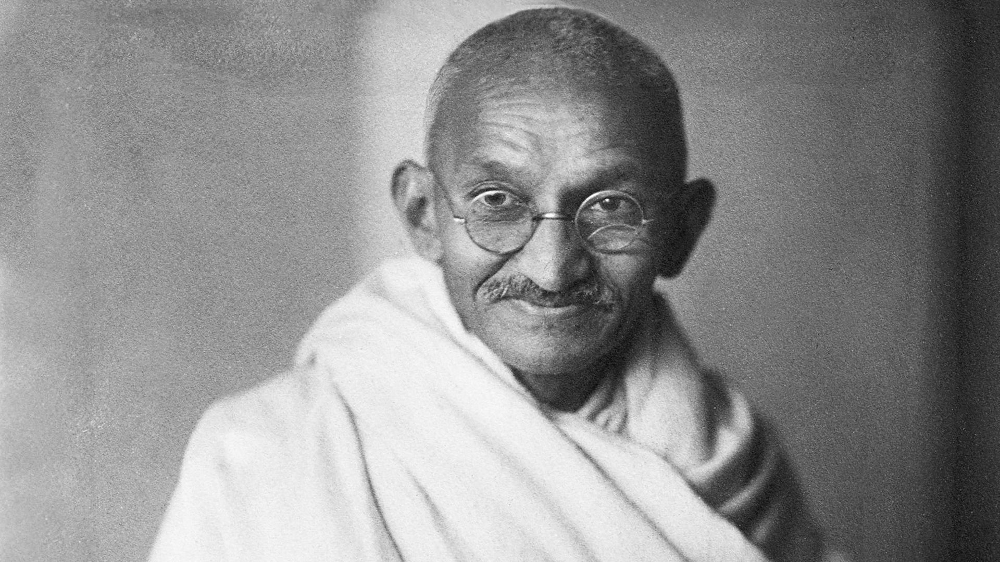



Gandhi.jpg is classified as RealArt


In [ ]:
uploaded = files.upload()

filename = next(iter(uploaded))  # Get the first key in the dictionary of uploaded files

# Load the image for display
loaded_img = Image.open(io.BytesIO(uploaded[filename]))

# Display the image
display(loaded_img)

if uploaded:
  classify_uploaded_image(m, device, classes)

<br>
<br>

# **Above Image is Correctly Classified as Real Image/Real Art.**

<br>
<br><br>

Saving AM.png to AM (3).png


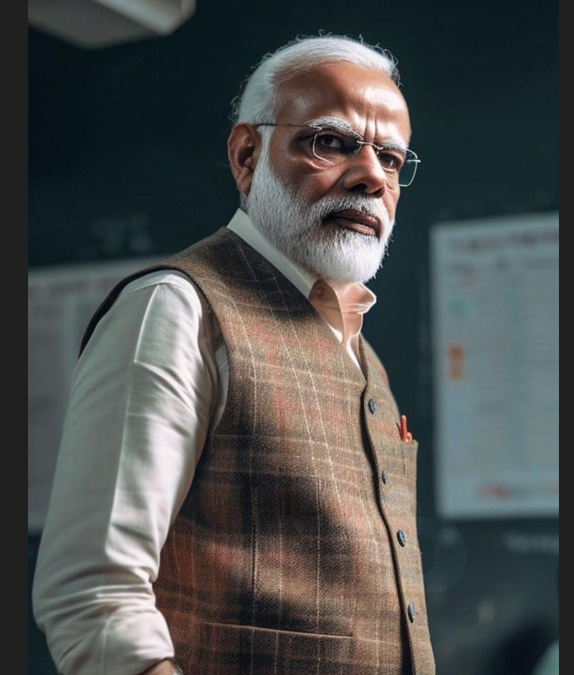



AM (3).png is classified as AiArtData


In [ ]:
uploaded = files.upload()

filename = next(iter(uploaded))  # Get the first key in the dictionary of uploaded files

# Load the image for display
loaded_img = Image.open(io.BytesIO(uploaded[filename]))

# Display the image
display(loaded_img)

if uploaded:
  classify_uploaded_image(m, device, classes)

# **Above Image is Correctly Classified as AI Art.**

<br>
<br><br>

Saving 6aofsvaglm_Medium_WW226365.jpg to 6aofsvaglm_Medium_WW226365.jpg


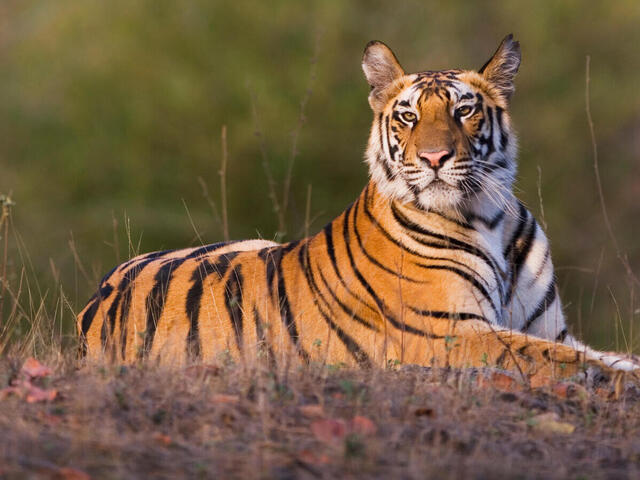



6aofsvaglm_Medium_WW226365.jpg is classified as RealArt


In [ ]:
uploaded = files.upload()

filename = next(iter(uploaded))  # Get the first key in the dictionary of uploaded files

# Load the image for display
loaded_img = Image.open(io.BytesIO(uploaded[filename]))

# Display the image
display(loaded_img)

if uploaded:
  classify_uploaded_image(m, device, classes)

# **Above Image is Correctly Classified as Real Image/Real Art.**

<br>
<br><br>

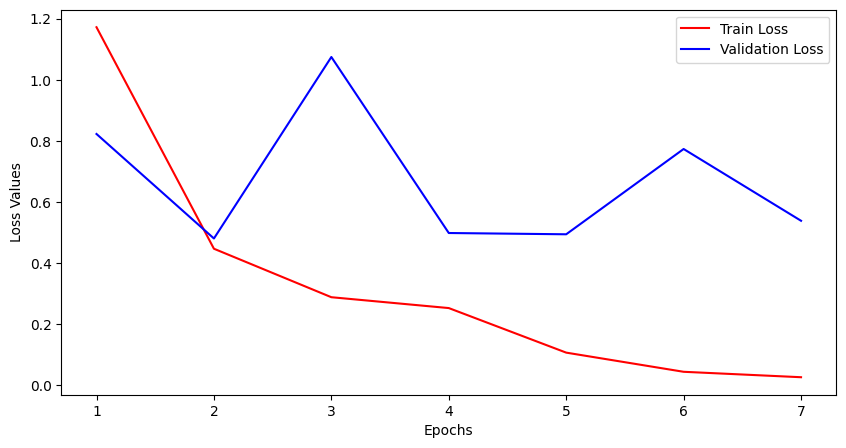

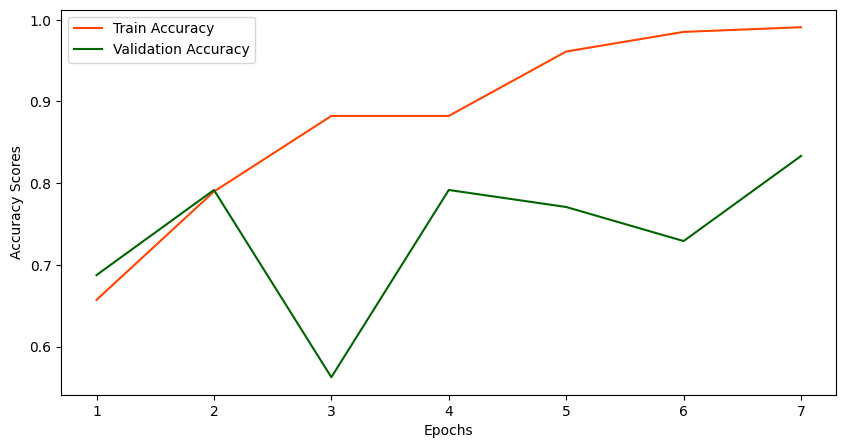

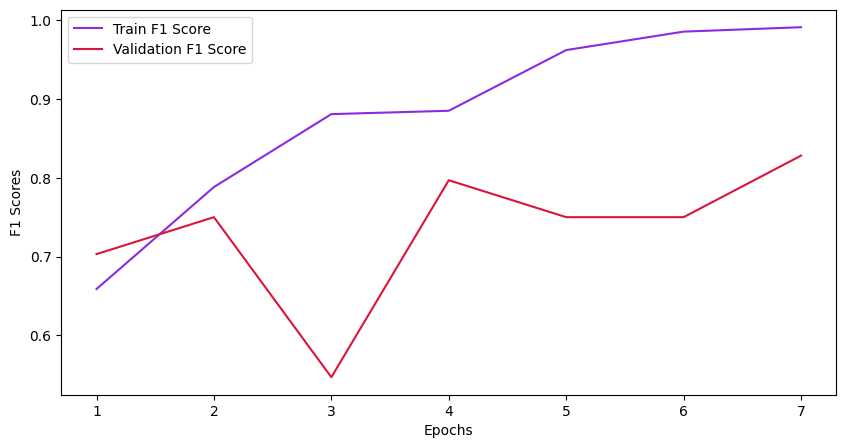

In [ ]:
class PlotLearningCurves:

    def __init__(self, tr_losses, val_losses, tr_accs, val_accs, tr_f1s, val_f1s):

        self.tr_losses, self.val_losses, self.tr_accs, self.val_accs, self.tr_f1s, self.val_f1s = tr_losses, val_losses, tr_accs, val_accs, tr_f1s, val_f1s

    def plot(self, array_1, array_2, label_1, label_2, color_1, color_2):

        plt.plot(array_1, label = label_1, c = color_1); plt.plot(array_2, label = label_2, c = color_2)

    def create_figure(self): plt.figure(figsize = (10, 5))

    def decorate(self, ylabel, xlabel = "Epochs"):

        plt.xlabel(xlabel); plt.ylabel(ylabel)
        plt.xticks(ticks = np.arange(len(self.tr_accs)), labels = [i for i in range(1, len(self.tr_accs) + 1)])
        plt.legend(); plt.show()

    def visualize(self):

        # Figure 1
        self.create_figure()
        self.plot(array_1 = self.tr_losses, array_2 = self.val_losses, label_1 = "Train Loss", label_2 = "Validation Loss", color_1 = "red", color_2 = "blue"); self.decorate(ylabel = "Loss Values")

        # Figure 2
        self.create_figure()
        self.plot(array_1 = self.tr_accs, array_2 = self.val_accs, label_1 = "Train Accuracy", label_2 = "Validation Accuracy", color_1 = "orangered", color_2 = "darkgreen")
        self.decorate(ylabel = "Accuracy Scores")

        # Figure 3
        self.create_figure()
        self.plot(array_1 = [tr_f1.cpu() for tr_f1 in self.tr_f1s], array_2 = [vl_f1.cpu() for vl_f1 in self.val_f1s], label_1 = "Train F1 Score", label_2 = "Validation F1 Score", color_1 = "blueviolet", color_2 = "crimson"); self.decorate(ylabel = "F1 Scores")

PlotLearningCurves(tr_losses, val_losses, tr_accs, val_accs, tr_f1s, val_f1s).visualize()

<br>
<br>
<br>

# **The following are the different accuracies obtained for the ML and Deep Learning Models used-**





In [ ]:
from IPython.display import HTML

# HTML content with inline styling
html_content = """
<table style="width:50%; border: 1px solid black; border-collapse: collapse;">
    <tr>
        <th style="border: 1px solid black; font-size: 20px; padding: 10px;">Model</th>
        <th style="border: 1px solid black; font-size: 20px; padding: 10px;">Accuracy</th>
    </tr>
    <tr>
        <td style="border: 1px solid black; font-size: 20px; padding: 10px;">Logistic Regression</td>
        <td style="border: 1px solid black; font-size: 20px; padding: 10px;">57%</td>
    </tr>
    <tr>
        <td style="border: 1px solid black; font-size: 20px; padding: 10px;">LDA</td>
        <td style="border: 1px solid black; font-size: 20px; padding: 10px;">49%</td>
    </tr>
    <tr>
        <td style="border: 1px solid black; font-size: 20px; padding: 10px;">Simple CNN</td>
        <td style="border: 1px solid black; font-size: 20px; padding: 10px;">61%</td>
    </tr>
    <tr>
        <td style="border: 1px solid black; font-size: 20px; padding: 10px;">MobileNetV2</td>
        <td style="border: 1px solid black; font-size: 20px; padding: 10px;">84%</td>
    </tr>
    <tr>
        <td style="border: 1px solid black; font-size: 20px; padding: 10px;">RexNet_150</td>
        <td style="border: 1px solid black; font-size: 20px; padding: 10px;">83%</td>
    </tr>
</table>
"""

# Display the HTML in the notebook
HTML(html_content)


Model,Accuracy
Logistic Regression,57%
LDA,49%
Simple CNN,61%
MobileNetV2,84%
RexNet_150,83%


<br>
<br>
<br>

# **Therefore from the Models Used, MobileNetV2 and RexNet_150 are the most effiecient Models to differenciate and classify AI Generated images and Actual/Regular Images**